In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score
from sklearn.tree import DecisionTreeClassifier

In [3]:
df= pd.read_csv('Churn_Modelling - KNN.csv')
df.head()

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   CreditScore      10000 non-null  int64  
 1   Geography        10000 non-null  object 
 2   Gender           10000 non-null  object 
 3   Age              10000 non-null  int64  
 4   Tenure           10000 non-null  int64  
 5   Balance          10000 non-null  float64
 6   NumOfProducts    10000 non-null  int64  
 7   HasCrCard        10000 non-null  int64  
 8   IsActiveMember   10000 non-null  int64  
 9   EstimatedSalary  10000 non-null  float64
 10  Exited           10000 non-null  int64  
dtypes: float64(2), int64(7), object(2)
memory usage: 859.5+ KB


In [5]:
df.isnull().sum()

CreditScore        0
Geography          0
Gender             0
Age                0
Tenure             0
Balance            0
NumOfProducts      0
HasCrCard          0
IsActiveMember     0
EstimatedSalary    0
Exited             0
dtype: int64

### EDA and Feature engineering

In [6]:
df['Exited'].value_counts()

Exited
0    7963
1    2037
Name: count, dtype: int64

In [7]:
df['Geography'].value_counts()

Geography
France     5014
Germany    2509
Spain      2477
Name: count, dtype: int64

In [8]:
df = pd.get_dummies(df,columns=['Geography','Gender'],dtype=int)
df.head()

,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Geography_France,Geography_Germany,Geography_Spain,Gender_Female,Gender_Male
0,619,42,2,0.00,1,1,1,101348.88,1,1,0,0,1,0
1,608,41,1,83807.86,1,0,1,112542.58,0,0,0,1,1,0
2,502,42,8,159660.80,3,1,0,113931.57,1,1,0,0,1,0
3,699,39,1,0.00,2,0,0,93826.63,0,1,0,0,1,0
4,850,43,2,125510.82,1,1,1,79084.10,0,0,0,1,1,0


### Model Building

In [9]:
x = df.drop('Exited',axis=1)
y = df['Exited']

In [10]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size = 0.2,random_state = 10,stratify=y)

In [11]:
dt_clf = DecisionTreeClassifier()

In [12]:
dt_clf.fit(x_train,y_train)

DecisionTreeClassifier()

In [13]:
y_pred_train = dt_clf.predict(x_train)
y_pred_test = dt_clf.predict(x_test)

### Test Evaluation

In [14]:
print(classification_report(y_test,y_pred_test))
print(confusion_matrix(y_test,y_pred_test))
print(accuracy_score(y_test,y_pred_test))

              precision    recall  f1-score   support

           0       0.87      0.86      0.86      1593
           1       0.47      0.48      0.47       407

    accuracy                           0.78      2000
   macro avg       0.67      0.67      0.67      2000
weighted avg       0.79      0.78      0.78      2000

[[1367  226]
 [ 210  197]]
0.782


### Train Evaluation

In [15]:
print(classification_report(y_train,y_pred_train))
print(confusion_matrix(y_train,y_pred_train))
print(accuracy_score(y_train,y_pred_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      6370
           1       1.00      1.00      1.00      1630

    accuracy                           1.00      8000
   macro avg       1.00      1.00      1.00      8000
weighted avg       1.00      1.00      1.00      8000

[[6370    0]
 [   0 1630]]
1.0


In [16]:
from sklearn.tree import plot_tree

[Text(0.6629633046128035, 0.9814814814814815, 'Age <= 42.5\ngini = 0.324\nsamples = 8000\nvalue = [6370, 1630]'),
 Text(0.48062759758370305, 0.9444444444444444, 'NumOfProducts <= 2.5\ngini = 0.206\nsamples = 5690\nvalue = [5027, 663]'),
 Text(0.37754354294564246, 0.9074074074074074, 'NumOfProducts <= 1.5\ngini = 0.185\nsamples = 5568\nvalue = [4993, 575]'),
 Text(0.26020083950251066, 0.8703703703703703, 'Geography_Germany <= 0.5\ngini = 0.277\nsamples = 2742\nvalue = [2287, 455]'),
 Text(0.1530862814262622, 0.8333333333333334, 'Balance <= 74197.941\ngini = 0.231\nsamples = 2081\nvalue = [1804, 277]'),
 Text(0.06777066996835879, 0.7962962962962963, 'IsActiveMember <= 0.5\ngini = 0.35\nsamples = 571\nvalue = [442, 129]'),
 Text(0.039104416013206765, 0.7592592592592593, 'Gender_Female <= 0.5\ngini = 0.415\nsamples = 272\nvalue = [192, 80]'),
 Text(0.016852386848259734, 0.7222222222222222, 'Tenure <= 2.5\ngini = 0.323\nsamples = 138\nvalue = [110, 28]'),
 Text(0.01575182280918971, 0.685185

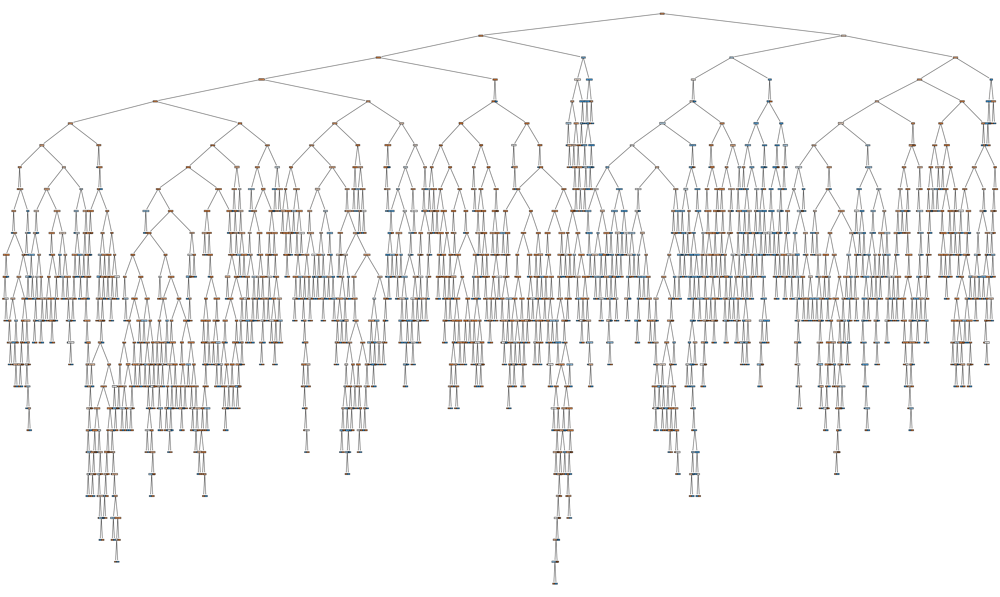

In [17]:
plt.figure(figsize=(50,30))
plot_tree(dt_clf,feature_names=x.columns,filled=True)

### Hyperparameter Tuning

In [18]:
hyp_grid= {'criterion':['gini','entropy'],
    'max_depth':np.arange(3,30),
    'min_samples_split':np.arange(10,30),
    'min_samples_leaf':np.arange(3,10),
    }

gscv = GridSearchCV(dt_clf,hyp_grid,cv=5)
gscv

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': array([ 3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19,
       20, 21, 22, 23, 24, 25, 26, 27, 28, 29]),
                         'min_samples_leaf': array([3, 4, 5, 6, 7, 8, 9]),
                         'min_samples_split': array([10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26,
       27, 28, 29])})

In [19]:
gscv.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': array([ 3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19,
       20, 21, 22, 23, 24, 25, 26, 27, 28, 29]),
                         'min_samples_leaf': array([3, 4, 5, 6, 7, 8, 9]),
                         'min_samples_split': array([10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26,
       27, 28, 29])})

In [20]:
gscv.best_estimator_

DecisionTreeClassifier(criterion='entropy', max_depth=7, min_samples_leaf=3,
                       min_samples_split=26)

In [21]:
dt_clf = gscv.best_estimator_
dt_clf

DecisionTreeClassifier(criterion='entropy', max_depth=7, min_samples_leaf=3,
                       min_samples_split=26)

In [22]:
dt_clf.fit(x_train,y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=7, min_samples_leaf=3,
                       min_samples_split=26)

In [23]:
y_pred_train = dt_clf.predict(x_train)
y_pred_test = dt_clf.predict(x_test)

### Test Evaluation

In [24]:
print(classification_report(y_test,y_pred_test))
print(confusion_matrix(y_test,y_pred_test))
print(accuracy_score(y_test,y_pred_test))

              precision    recall  f1-score   support

           0       0.87      0.96      0.91      1593
           1       0.76      0.44      0.56       407

    accuracy                           0.86      2000
   macro avg       0.81      0.70      0.74      2000
weighted avg       0.85      0.86      0.84      2000

[[1535   58]
 [ 228  179]]
0.857


### Train Evalution

In [25]:
print(classification_report(y_train,y_pred_train))
print(confusion_matrix(y_train,y_pred_train))
print(accuracy_score(y_train,y_pred_train))

              precision    recall  f1-score   support

           0       0.88      0.97      0.92      6370
           1       0.79      0.48      0.60      1630

    accuracy                           0.87      8000
   macro avg       0.83      0.73      0.76      8000
weighted avg       0.86      0.87      0.86      8000

[[6157  213]
 [ 841  789]]
0.86825


In [26]:
plt.figure(figsize=(300,200))
plot_tree(dt_clf,feature_names=x.columns,filled=True)
plt.savefig('churn Decision tree.png')

### Sampling

In [27]:
from imblearn.over_sampling import RandomOverSampler

In [28]:
from imblearn.over_sampling import SMOTE

In [29]:
smote=SMOTE()

In [30]:
x_sampled,y_sampled =smote.fit_resample(x,y)

In [31]:
y_sampled

0        1
1        0
2        1
3        0
4        0
        ..
15921    1
15922    1
15923    1
15924    1
15925    1
Name: Exited, Length: 15926, dtype: int64

In [32]:
x_train,x_test,y_train,y_test=train_test_split(x_sampled,y_sampled,test_size=0.2,random_state=10,stratify=y_sampled)

In [33]:
dt_clf_s = DecisionTreeClassifier()

In [34]:
dt_clf_s.fit(x_train,y_train)

DecisionTreeClassifier()

In [35]:
y_pred_test=dt_clf_s.predict(x_test)
y_pred_train=dt_clf_s.predict(x_train)

### Test

In [36]:
print(classification_report(y_test,y_pred_test))
print(confusion_matrix(y_test,y_pred_test))
print(accuracy_score(y_test,y_pred_test))

              precision    recall  f1-score   support

           0       0.85      0.81      0.83      1593
           1       0.82      0.86      0.84      1593

    accuracy                           0.84      3186
   macro avg       0.84      0.84      0.84      3186
weighted avg       0.84      0.84      0.84      3186

[[1293  300]
 [ 220 1373]]
0.8367859384808537


### Train

In [37]:
print(classification_report(y_train,y_pred_train))
print(confusion_matrix(y_train,y_pred_train))
print(accuracy_score(y_train,y_pred_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      6370
           1       1.00      1.00      1.00      6370

    accuracy                           1.00     12740
   macro avg       1.00      1.00      1.00     12740
weighted avg       1.00      1.00      1.00     12740

[[6370    0]
 [   0 6370]]
1.0


### Hyperparameter Tuning

In [38]:
hyp_grid= {'criterion':['gini','entropy'],
    'max_depth':np.arange(3,30),
    'min_samples_split':np.arange(10,30),
    'min_samples_leaf':np.arange(3,10),
    }

gscv = GridSearchCV(dt_clf_s,hyp_grid,cv=5,n_jobs=-1)
gscv

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': array([ 3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19,
       20, 21, 22, 23, 24, 25, 26, 27, 28, 29]),
                         'min_samples_leaf': array([3, 4, 5, 6, 7, 8, 9]),
                         'min_samples_split': array([10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26,
       27, 28, 29])})

In [39]:
gscv.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': array([ 3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19,
       20, 21, 22, 23, 24, 25, 26, 27, 28, 29]),
                         'min_samples_leaf': array([3, 4, 5, 6, 7, 8, 9]),
                         'min_samples_split': array([10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26,
       27, 28, 29])})

In [40]:
gscv.best_estimator_

DecisionTreeClassifier(criterion='entropy', max_depth=10, min_samples_leaf=3,
                       min_samples_split=28)

In [41]:
dt_clf_s=gscv.best_estimator_

In [42]:
dt_clf_s.fit(x_train,y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=10, min_samples_leaf=3,
                       min_samples_split=28)

In [43]:
y_pred_test=dt_clf_s.predict(x_test)
y_pred_train=dt_clf_s.predict(x_train)

### Test

In [44]:
print(classification_report(y_test,y_pred_test))
print(confusion_matrix(y_test,y_pred_test))
print(accuracy_score(y_test,y_pred_test))

              precision    recall  f1-score   support

           0       0.85      0.86      0.85      1593
           1       0.86      0.84      0.85      1593

    accuracy                           0.85      3186
   macro avg       0.85      0.85      0.85      3186
weighted avg       0.85      0.85      0.85      3186

[[1369  224]
 [ 251 1342]]
0.8509102322661645


### Train

In [45]:
print(classification_report(y_train,y_pred_train))
print(confusion_matrix(y_train,y_pred_train))
print(accuracy_score(y_train,y_pred_train))

              precision    recall  f1-score   support

           0       0.88      0.89      0.88      6370
           1       0.89      0.87      0.88      6370

    accuracy                           0.88     12740
   macro avg       0.88      0.88      0.88     12740
weighted avg       0.88      0.88      0.88     12740

[[5688  682]
 [ 800 5570]]
0.8836734693877552


### Post Pruning

In [46]:
dt_clf_p = DecisionTreeClassifier()

In [47]:
ccp_alpha = dt_clf_p.cost_complexity_pruning_path(x_train,y_train)['ccp_alphas']
ccp_alpha

array([0.00000000e+00, 3.87300669e-05, 3.90815667e-05, 4.95744857e-05,
       5.02354788e-05, 5.05241885e-05, 5.05832688e-05, 5.07895466e-05,
       5.08750509e-05, 5.09515547e-05, 5.10204082e-05, 5.14264061e-05,
       5.15235680e-05, 5.20782476e-05, 5.23286238e-05, 5.23286238e-05,
       5.88697017e-05, 5.88697017e-05, 5.88697017e-05, 5.88697017e-05,
       5.88697017e-05, 5.88697017e-05, 6.03791813e-05, 6.10500611e-05,
       6.20120269e-05, 6.42214928e-05, 6.54107797e-05, 6.54107797e-05,
       6.54107797e-05, 6.54107797e-05, 6.54107797e-05, 6.54107797e-05,
       6.54107797e-05, 6.54107797e-05, 6.54107797e-05, 6.54107797e-05,
       6.54107797e-05, 6.54107797e-05, 6.64170994e-05, 6.72796591e-05,
       6.72796591e-05, 6.72796591e-05, 6.72796591e-05, 6.72796591e-05,
       6.72796591e-05, 6.72796591e-05, 6.80272109e-05, 6.86813187e-05,
       6.86813187e-05, 6.97714983e-05, 6.97714983e-05, 6.97714983e-05,
       6.97714983e-05, 6.97714983e-05, 6.97714983e-05, 6.97714983e-05,
      

In [48]:
test_acc = []
train_acc =[]

for i in ccp_alpha:
    dt_clf_p = DecisionTreeClassifier(ccp_alpha= i )
    dt_clf_p.fit(x_train,y_train)
    y_pred_test=dt_clf_p.predict(x_test)
    y_pred_train=dt_clf_p.predict(x_train)
    acc_test = accuracy_score(y_test,y_pred_test)
    test_acc.append(acc_test)
    acc_train = accuracy_score(y_train,y_pred_train)
    train_acc.append(acc_train)


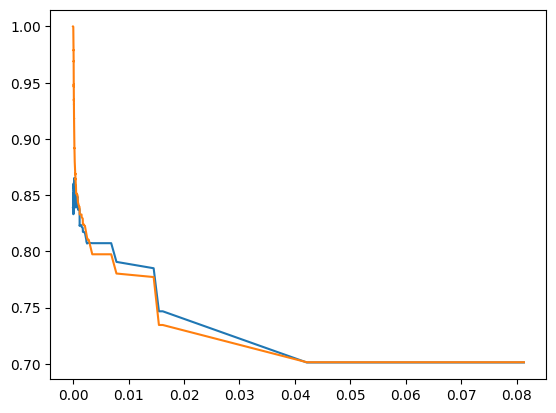

In [49]:
plt.plot(ccp_alpha,test_acc)
plt.plot(ccp_alpha,train_acc)

In [50]:
import plotly.express as px

In [51]:
px.line(x=ccp_alpha,y=test_acc)

In [52]:
np.where(ccp_alpha<=0.000688542)

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
        104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
        117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
        130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
        143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
        156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
        169, 170, 171, 172, 173, 174, 175, 176, 177

In [53]:
ccp_alpha[639]

0.0003204269620916563

In [54]:
test_acc[639]

0.8556183301946014

In [55]:
train_acc[639]

0.8773940345368917

In [56]:
columns_name =x.columns.tolist()
columns_name

['CreditScore',
 'Age',
 'Tenure',
 'Balance',
 'NumOfProducts',
 'HasCrCard',
 'IsActiveMember',
 'EstimatedSalary',
 'Geography_France',
 'Geography_Germany',
 'Geography_Spain',
 'Gender_Female',
 'Gender_Male']

In [57]:
CreditScore = 619
Age = 43
Tenure = 1
Balance = 125211.92
NumOfProducts = 1
HasCrCard = 1
IsActiveMember = 1
EstimatedSalary = 113410.49
Geography = 'France'
Gender = 'Male'

In [58]:
CreditScore = 619
Age = 43
Tenure = 1
Balance = 125211.92
NumOfProducts = 1
HasCrCard = 1
IsActiveMember = 1
EstimatedSalary = 113410.49
Geography = 'Geography_' + Geography
Gender = 'Gender_' + Gender

In [59]:
columns_name =x.columns.tolist()
columns_name

['CreditScore',
 'Age',
 'Tenure',
 'Balance',
 'NumOfProducts',
 'HasCrCard',
 'IsActiveMember',
 'EstimatedSalary',
 'Geography_France',
 'Geography_Germany',
 'Geography_Spain',
 'Gender_Female',
 'Gender_Male']

In [60]:
Geography_index = columns_name.index(Geography)
print(Geography_index)
Gender_index = columns_name.index(Gender)
print(Gender_index)

8
12


In [61]:
test_array = np.zeros([1,x.shape[1]])
test_array


array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]])

In [62]:
test_array[0,0] = CreditScore
test_array[0,1] = Age
test_array[0,2] = Tenure
test_array[0,3] = Balance
test_array[0,4] = NumOfProducts
test_array[0,5] = HasCrCard
test_array[0,6] = IsActiveMember
test_array[0,7] = EstimatedSalary
test_array[0,Geography_index] = 1
test_array[0,Gender_index] = 1

In [63]:
import pickle
import json

In [64]:
with open ('Churn_model.pkl', 'wb') as f:
    pickle.dump(dt_clf_p,f)

In [65]:
project_data = {"Column Names" : columns_name}

with open('proj_data.json','w') as f:
    json.dump(project_data, f)